In [25]:
import json
import numpy as np
import matplotlib.pyplot as plt

from bpemb import BPEmb
from pathlib import Path
from itertools import chain
from collections import Counter

import youtokentome as yttm

In [2]:
data = json.loads(Path('/home/kris/data/text/raw/articles-spiegelde-570k.json').read_bytes())

In [3]:
articles = ['\n'.join(datum['paragraphs']) for datum in data]

In [4]:
print(articles[0])

Herr Köhler, Sie wirken erschöpft.
Simon Köhler: Ich bin total geschafft. Ich habe im Flughafen von Kopenhagen neben der Toilette gepennt. Da kam andauernd die Putzmaschine vorbei.
SPIEGEL ONLINE: Wie sind Sie dort gelandet?
Köhler: Ich fahre immer zu den Spielen der deutschen Nationalmannschaft. Am Freitagabend sind wir von Frankfurt nach London geflogen, haben da am Flughafen gepennt. Dann ging es weiter nach Glasgow, wo die Partie gegen Schottland stattfand. Am Montag sind wir von Glasgow zurück nach London und dann weiter nach Malmö geflogen, dann nach Kopenhagen. Dort war die Jugendherberge leider ausgebucht. Am Dienstag haben wir den Flieger auf die Färöer genommen.
SPIEGEL ONLINE: Warum betreiben Sie so viel Aufwand?
Köhler: Hauptsächlich wegen der Nationalelf. Ich interessiere mich sehr für Fußball. Außerdem ist es auch interessant, ein Land zu sehen, in dem ich noch nicht war. Über Fußball wiederum kommt man dort mit vielen Leuten sehr schnell ins Gespräch.
SPIEGEL ONLINE: Wie

In [33]:
#bpe = BPEmb(lang='de', vs=1000)
bpe = yttm.BPE(model='model.p')

In [34]:
ratio = []
encoded = []
for article in articles[:10000]:
    if not article:
        continue
    encode = bpe.encode(article)
    if not encode:
        continue
    encoded.append(encode)
    ratio.append(len(article) / len(encode))

print(np.mean(ratio))

4.012688740080525


In [35]:
lengths = list(map(len, articles))

(array([  975.,  1956.,  3360.,  4434.,  6063.,  8583., 10656., 12738.,
        14628., 16149., 17154., 17852., 17629., 17413., 17268., 16623.,
        16092., 16030., 16133., 14838., 13956., 13237., 12365., 11813.,
        10908., 10412., 10126.,  9319.,  8696.,  8506.,  8048.,  7719.,
         7562.,  7302.,  6896.,  6895.,  6711.,  6536.,  6247.,  6149.,
         6059.,  6030.,  5983.,  5842.,  5988.,  5868.,  5578.,  5574.,
         5351.,  5176.,  4727.,  4392.,  4075.,  3779.,  3566.,  3389.,
         3237.,  2903.,  2824.,  2558.,  2349.,  2173.,  2105.,  1946.,
         1777.,  1642.,  1630.,  1427.,  1418.,  1297.,  1130.,  1073.,
          959.,   941.,   854.,   813.,   786.,   718.,   676.,   622.,
          551.,   500.,   520.,   451.,   405.,   377.,   333.,   303.,
          325.,   272.,   267.,   231.,   257.,   210.,   212.,   193.,
          197.,   170.,   170.,   135.]),
 array([  100.,   199.,   298.,   397.,   496.,   595.,   694.,   793.,
          892.,   991.

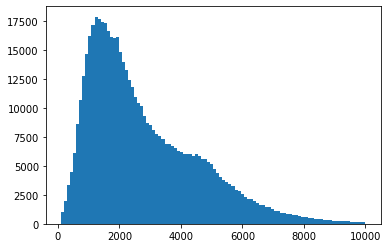

In [36]:
plt.hist(lengths, range=(100, 10000), bins=100)

In [14]:
encoded

[[1146,
  6325,
  2949,
  9940,
  178,
  6176,
  940,
  9949,
  5685,
  9935,
  0,
  8928,
  20,
  6325,
  2949,
  9948,
  3077,
  4725,
  5854,
  37,
  410,
  7533,
  9935,
  3077,
  2796,
  88,
  4779,
  76,
  3530,
  9634,
  880,
  26,
  1366,
  66,
  1960,
  98,
  9936,
  1711,
  9935,
  326,
  689,
  727,
  3354,
  9922,
  31,
  52,
  548,
  8162,
  7390,
  9935,
  0,
  5355,
  4197,
  9948,
  249,
  290,
  178,
  735,
  470,
  15,
  318,
  9974,
  0,
  9933,
  9949,
  2949,
  9948,
  3077,
  1204,
  9915,
  1391,
  114,
  91,
  2463,
  26,
  734,
  888,
  2773,
  9935,
  162,
  217,
  95,
  216,
  6404,
  9922,
  290,
  235,
  76,
  2019,
  146,
  1987,
  98,
  365,
  1107,
  9940,
  952,
  326,
  162,
  4779,
  98,
  9936,
  1711,
  9935,
  941,
  1797,
  234,
  426,
  146,
  3859,
  9322,
  9940,
  535,
  31,
  1900,
  9,
  394,
  5150,
  268,
  1167,
  9932,
  87,
  9935,
  162,
  2374,
  216,
  290,
  235,
  76,
  3859,
  9322,
  809,
  146,
  1987,
  43,
  941,
  426,
  146,

In [22]:
counter = Counter(chain.from_iterable(encoded))

(array([2987079., 1169133.,  464083.,  266253.,  223053.,  195649.,
         135531.,  122806.,  112971.,  118437.,   84217.,   86236.,
          78577.,   68443.,   68002.,   61167.,   57282.,   63777.,
          53660.,   56837.,   48357.,   46634.,   48557.,   42223.,
          42466.,   40934.,   39387.,   41365.,   36231.,   33350.,
          31929.,   36841.,   28820.,   28983.,   26489.,   27981.,
          26066.,   28688.,   25839.,   25822.,   25956.,   24841.,
          24057.,   23078.,   22898.,   22176.,   24539.,   22835.,
          20119.,   21834.,   20659.,   20309.,   18102.,   18528.,
          17749.,   17466.,   17612.,   20727.,   16858.,   15483.,
          15608.,   15686.,   15896.,   16071.,   15840.,   13699.,
          15097.,   14241.,   13309.,   14120.,   13541.,   11150.,
          12037.,   12734.,   11995.,   11253.,   12293.,   10263.,
          12817.,   13001.,   12191.,   11086.,   11341.,    9958.,
          11069.,   11910.,   10823.,   10604., 

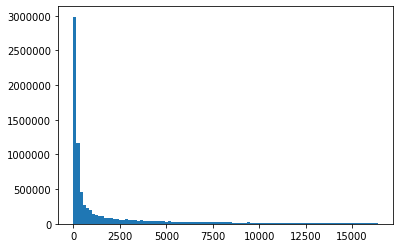

In [37]:
plt.hist(list(chain.from_iterable(encoded)), bins=100)

In [25]:
len(bpe.encode(articles[0]))

2170

In [ ]:
t